In [17]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.decomposition import PCA
from keras.models import Sequential
from keras.layers import Dense

# Load the dataset (replace 'your_data.csv' with your actual file path)
df = pd.read_csv('IGI.csv')

# Ensure the 'timestamp' column is in datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Feature engineering (example features: glucose levels, time of day, etc.)
df['hour'] = df['timestamp'].dt.hour
df['sin_hour'] = np.sin(2 * np.pi * df['hour'] / 24)
df['cos_hour'] = np.cos(2 * np.pi * df['hour'] / 24)

# Features (X) and target (y)
X = df[['Glucose_old', 'Glucose_new', 'sin_hour', 'cos_hour']].values
y = df['Insulin'].values

# Split the data into training and testing sets (assuming patient ID column exists)
X_train, X_test, y_train, y_test, train_idx, test_idx = train_test_split(X, y, df.index, test_size=0.2, random_state=42)

# Store first 10 patients' IDs (assuming 'id' column exists)
first_10_patients_ids = df['id'].unique()[:10]


Define Functions and Initialize Storage

In [18]:
# Function to compute Adjusted R²
def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Initialize result storage for all metrics
results_detailed = {'Algorithm': [], 'RMSE': [], 'MAE': [], 'R²': [], 'Adjusted R²': [],
                    'P-value': [], 't-statistic': [], 'F-statistic': [], 'Durbin-Watson': [],
                    'AIC': [], 'BIC': []}


Explanation of Statistical Metrics

In [19]:
# Explanation of each metric
metrics_explanation = """
- **RMSE (Root Mean Squared Error)**: Measures the average squared difference between predicted and actual values. Lower is better.
- **MAE (Mean Absolute Error)**: Measures the average absolute difference between predicted and actual values. Lower is better.
- **R² (R-squared)**: Measures the proportion of variance explained by the model. Higher is better (ranges from 0 to 1).
- **Adjusted R²**: Similar to R² but adjusts for the number of predictors. Higher is better.
- **P-value**: Indicates the significance of individual features in the model. A lower value (typically < 0.05) indicates that the feature significantly influences the outcome.
- **t-statistic**: A higher absolute value indicates a greater significance of the feature in the model.
- **F-statistic**: Tests the overall significance of the model. Higher values indicate a more significant model.
- **Durbin-Watson**: Tests for autocorrelation in the residuals (should be close to 2 for no autocorrelation).
- **AIC (Akaike Information Criterion)**: A measure of the quality of the model; lower values are better.
- **BIC (Bayesian Information Criterion)**: Similar to AIC but with a higher penalty for models with more parameters.
"""
print(metrics_explanation)



- **RMSE (Root Mean Squared Error)**: Measures the average squared difference between predicted and actual values. Lower is better.
- **MAE (Mean Absolute Error)**: Measures the average absolute difference between predicted and actual values. Lower is better.
- **R² (R-squared)**: Measures the proportion of variance explained by the model. Higher is better (ranges from 0 to 1).
- **Adjusted R²**: Similar to R² but adjusts for the number of predictors. Higher is better.
- **P-value**: Indicates the significance of individual features in the model. A lower value (typically < 0.05) indicates that the feature significantly influences the outcome.
- **t-statistic**: A higher absolute value indicates a greater significance of the feature in the model.
- **F-statistic**: Tests the overall significance of the model. Higher values indicate a more significant model.
- **Durbin-Watson**: Tests for autocorrelation in the residuals (should be close to 2 for no autocorrelation).
- **AIC (Akaike Inf

Train and Evaluate Linear Regression Model

In [20]:
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Add constant to the model (for intercept)
X_train_with_const = sm.add_constant(X_train)
X_test_with_const = sm.add_constant(X_test)

# Fit the Linear Regression model using statsmodels (OLS)
ols_model = sm.OLS(y_train, X_train_with_const).fit()
ols_pred = ols_model.predict(X_test_with_const)

# Compute metrics for Linear Regression
ols_rmse = np.sqrt(mean_squared_error(y_test, ols_pred))
ols_mae = mean_absolute_error(y_test, ols_pred)
ols_r2 = r2_score(y_test, ols_pred)
ols_adjusted_r2 = adjusted_r2(ols_r2, len(y_test), X_test.shape[1])

# Extract stats from the OLS summary
ols_summary = ols_model.summary2().tables[1]
ols_pvalues = ols_summary['P>|t|'].values
ols_tstat = ols_summary['t'].values
ols_fstat = ols_model.fvalue
ols_durbin_watson = sm.stats.durbin_watson(ols_model.resid)
ols_aic = ols_model.aic
ols_bic = ols_model.bic

# Store results for Linear Regression
results_detailed['Algorithm'].append('OLS Linear Regression')
results_detailed['RMSE'].append(ols_rmse)
results_detailed['MAE'].append(ols_mae)
results_detailed['R²'].append(ols_r2)
results_detailed['Adjusted R²'].append(ols_adjusted_r2)
results_detailed['P-value'].append(ols_pvalues)
results_detailed['t-statistic'].append(ols_tstat)
results_detailed['F-statistic'].append(ols_fstat)
results_detailed['Durbin-Watson'].append(ols_durbin_watson)
results_detailed['AIC'].append(ols_aic)
results_detailed['BIC'].append(ols_bic)


Interactive Bar Plot for Linear Regression Metrics

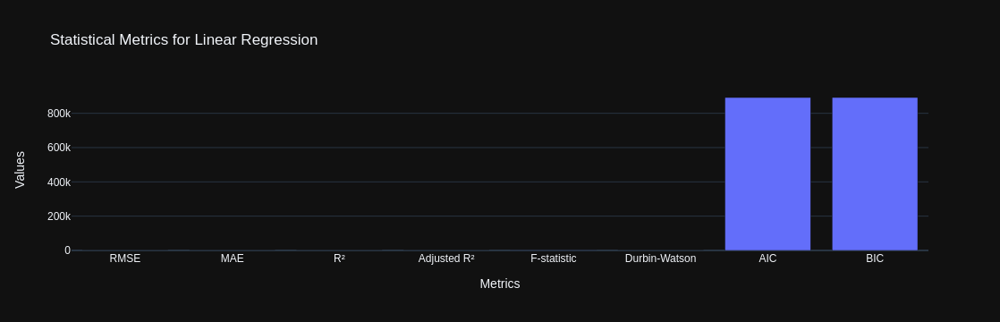

In [21]:
import plotly.graph_objects as go

# Data for plotting
metrics = ['RMSE', 'MAE', 'R²', 'Adjusted R²', 'F-statistic', 'Durbin-Watson', 'AIC', 'BIC']
metric_values = [ols_rmse, ols_mae, ols_r2, ols_adjusted_r2, ols_fstat, ols_durbin_watson, ols_aic, ols_bic]

# Create a bar plot
fig = go.Figure(data=[
    go.Bar(name='Linear Regression', x=metrics, y=metric_values)
])

# Customize the layout
fig.update_layout(
    title="Statistical Metrics for Linear Regression",
    xaxis_title="Metrics",
    yaxis_title="Values",
    hovermode="x",
    showlegend=False
)

# Show the plot
fig.show()


Train and Evaluate PCA + Linear Regression

In [22]:
from sklearn.decomposition import PCA

# Apply PCA (reduce to 2 components)
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Fit PCA + Linear Regression using OLS from statsmodels
X_train_pca_with_const = sm.add_constant(X_train_pca)
X_test_pca_with_const = sm.add_constant(X_test_pca)

pca_ols_model = sm.OLS(y_train, X_train_pca_with_const).fit()
pca_ols_pred = pca_ols_model.predict(X_test_pca_with_const)

# Compute metrics for PCA + Linear Regression
pca_ols_rmse = np.sqrt(mean_squared_error(y_test, pca_ols_pred))
pca_ols_mae = mean_absolute_error(y_test, pca_ols_pred)
pca_ols_r2 = r2_score(y_test, pca_ols_pred)
pca_ols_adjusted_r2 = adjusted_r2(pca_ols_r2, len(y_test), X_test_pca.shape[1])

# Extract stats from the OLS summary
pca_ols_summary = pca_ols_model.summary2().tables[1]
pca_ols_pvalues = pca_ols_summary['P>|t|'].values
pca_ols_tstat = pca_ols_summary['t'].values
pca_ols_fstat = pca_ols_model.fvalue
pca_ols_durbin_watson = sm.stats.durbin_watson(pca_ols_model.resid)
pca_ols_aic = pca_ols_model.aic
pca_ols_bic = pca_ols_model.bic

# Store results for PCA + Linear Regression
results_detailed['Algorithm'].append('PCA + Linear Regression')
results_detailed['RMSE'].append(pca_ols_rmse)
results_detailed['MAE'].append(pca_ols_mae)
results_detailed['R²'].append(pca_ols_r2)
results_detailed['Adjusted R²'].append(pca_ols_adjusted_r2)
results_detailed['P-value'].append(pca_ols_pvalues)
results_detailed['t-statistic'].append(pca_ols_tstat)
results_detailed['F-statistic'].append(pca_ols_fstat)
results_detailed['Durbin-Watson'].append(pca_ols_durbin_watson)
results_detailed['AIC'].append(pca_ols_aic)
results_detailed['BIC'].append(pca_ols_bic)


Interactive Bar Plot for PCA + Linear Regression Metrics

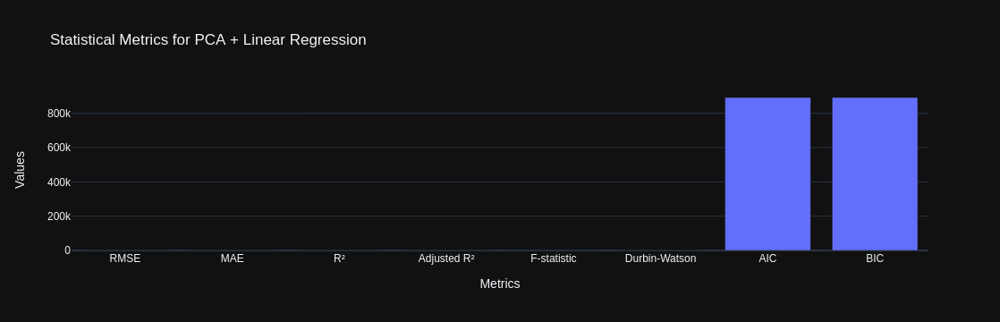

In [23]:
import plotly.graph_objects as go

# Data for plotting
metrics = ['RMSE', 'MAE', 'R²', 'Adjusted R²', 'F-statistic', 'Durbin-Watson', 'AIC', 'BIC']
metric_values = [pca_ols_rmse, pca_ols_mae, pca_ols_r2, pca_ols_adjusted_r2, pca_ols_fstat, pca_ols_durbin_watson, pca_ols_aic, pca_ols_bic]

# Create a bar plot
fig = go.Figure(data=[
    go.Bar(name='PCA + Linear Regression', x=metrics, y=metric_values)
])

# Customize the layout
fig.update_layout(
    title="Statistical Metrics for PCA + Linear Regression",
    xaxis_title="Metrics",
    yaxis_title="Values",
    hovermode="x",
    showlegend=False
)

# Show the plot
fig.show()


Interactive Scatter Plot for PCA Components

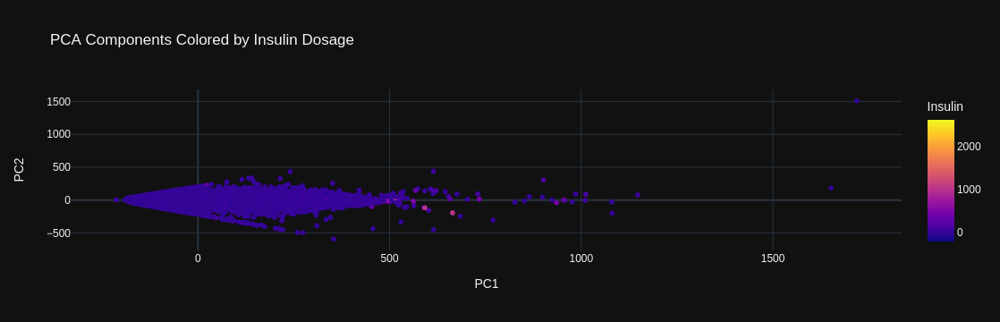

In [24]:
import plotly.express as px

# Plot the first two PCA components with a color mapping to the insulin dosage
pca_df = pd.DataFrame(X_train_pca, columns=['PC1', 'PC2'])
pca_df['Insulin'] = y_train

# Create an interactive scatter plot
fig_pca = px.scatter(pca_df, x='PC1', y='PC2', color='Insulin', title="PCA Components Colored by Insulin Dosage")

# Show the plot
fig_pca.show()


Train and Evaluate Random Forest

In [25]:
from sklearn.ensemble import RandomForestRegressor

# Train Random Forest model
rf = RandomForestRegressor()
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)

# Compute metrics for Random Forest
rf_rmse = np.sqrt(mean_squared_error(y_test, rf_pred))
rf_mae = mean_absolute_error(y_test, rf_pred)
rf_r2 = r2_score(y_test, rf_pred)
rf_adjusted_r2 = adjusted_r2(rf_r2, len(y_test), X_test.shape[1])

# Store results for Random Forest
results_detailed['Algorithm'].append('Random Forest')
results_detailed['RMSE'].append(rf_rmse)
results_detailed['MAE'].append(rf_mae)
results_detailed['R²'].append(rf_r2)
results_detailed['Adjusted R²'].append(rf_adjusted_r2)
results_detailed['P-value'].append('N/A')
results_detailed['t-statistic'].append('N/A')
results_detailed['F-statistic'].append('N/A')
results_detailed['Durbin-Watson'].append('N/A')
results_detailed['AIC'].append('N/A')
results_detailed['BIC'].append('N/A')


Interactive Bar Plot for Random Forest Metrics

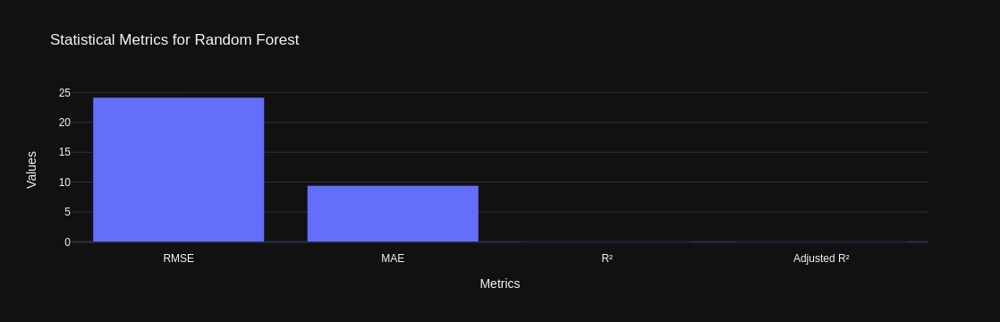

In [26]:
import plotly.graph_objects as go

# Data for plotting
metrics_rf = ['RMSE', 'MAE', 'R²', 'Adjusted R²']
metric_values_rf = [rf_rmse, rf_mae, rf_r2, rf_adjusted_r2]

# Create a bar plot for Random Forest
fig_rf = go.Figure(data=[
    go.Bar(name='Random Forest', x=metrics_rf, y=metric_values_rf)
])

# Customize the layout
fig_rf.update_layout(
    title="Statistical Metrics for Random Forest",
    xaxis_title="Metrics",
    yaxis_title="Values",
    hovermode="x",
    showlegend=False
)

# Show the plot
fig_rf.show()


Feature Importance Plot for Random Forest

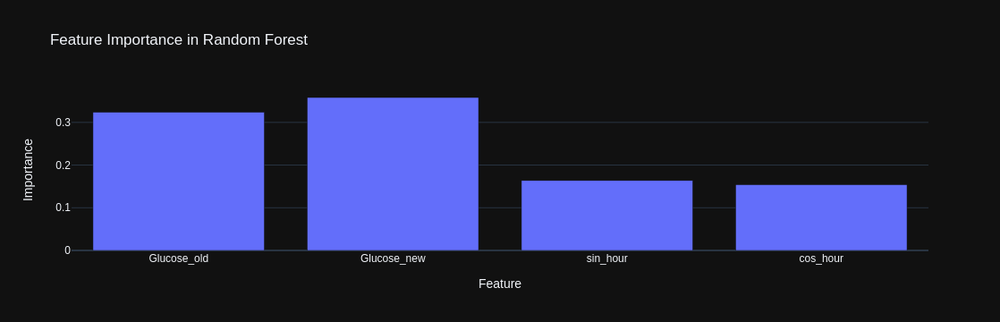

In [27]:
import plotly.express as px

# Get feature importances from the Random Forest model
feature_importances = rf.feature_importances_
features = ['Glucose_old', 'Glucose_new', 'sin_hour', 'cos_hour']  # Example features

# Create a DataFrame for the feature importance values
feature_importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importances})

# Create an interactive bar plot for feature importance
fig_feature_importance = px.bar(feature_importance_df, x='Feature', y='Importance', title="Feature Importance in Random Forest")

# Show the plot
fig_feature_importance.show()


Train and Evaluate Deep Neural Network (DNN)

In [28]:
from keras.models import Sequential
from keras.layers import Dense

# Build and compile DNN model
dnn_model = Sequential()
dnn_model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
dnn_model.add(Dense(64, activation='relu'))
dnn_model.add(Dense(1, activation='linear'))
dnn_model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

# Train the DNN model and store the history
history = dnn_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

# Predictions
dnn_pred = dnn_model.predict(X_test).flatten()

# Compute metrics for DNN
dnn_rmse = np.sqrt(mean_squared_error(y_test, dnn_pred))
dnn_mae = mean_absolute_error(y_test, dnn_pred)
dnn_r2 = r2_score(y_test, dnn_pred)
dnn_adjusted_r2 = adjusted_r2(dnn_r2, len(y_test), X_test.shape[1])

# Store results for DNN
results_detailed['Algorithm'].append('Deep Neural Network')
results_detailed['RMSE'].append(dnn_rmse)
results_detailed['MAE'].append(dnn_mae)
results_detailed['R²'].append(dnn_r2)
results_detailed['Adjusted R²'].append(dnn_adjusted_r2)
results_detailed['P-value'].append('N/A')
results_detailed['t-statistic'].append('N/A')
results_detailed['F-statistic'].append('N/A')
results_detailed['Durbin-Watson'].append('N/A')
results_detailed['AIC'].append('N/A')
results_detailed['BIC'].append('N/A')



Epoch 1/50
2444/2444 [==============================] - 9s 3ms/step - loss: 527.2230 - mae: 8.4870 - val_loss: 655.3973 - val_mae: 8.7047
Epoch 2/50
2444/2444 [==============================] - 6s 3ms/step - loss: 516.8338 - mae: 8.2135 - val_loss: 653.2389 - val_mae: 8.2531
Epoch 3/50
2444/2444 [==============================] - 8s 3ms/step - loss: 513.2973 - mae: 8.1311 - val_loss: 652.6273 - val_mae: 7.8401
Epoch 4/50
2444/2444 [==============================] - 9s 4ms/step - loss: 512.7877 - mae: 8.0706 - val_loss: 656.3425 - val_mae: 8.8957
Epoch 5/50
2444/2444 [==============================] - 8s 3ms/step - loss: 512.3316 - mae: 8.0928 - val_loss: 652.9501 - val_mae: 7.6830
Epoch 6/50
2444/2444 [==============================] - 7s 3ms/step - loss: 512.2792 - mae: 8.0687 - val_loss: 657.2090 - val_mae: 9.0192
Epoch 7/50
2444/2444 [==============================] - 8s 3ms/step - loss: 511.8539 - mae: 8.0980 - val_loss: 653.0850 - val_mae: 7.6311
Epoch 8/50
2444/2444 [============

Interactive Bar Plot for DNN Metrics

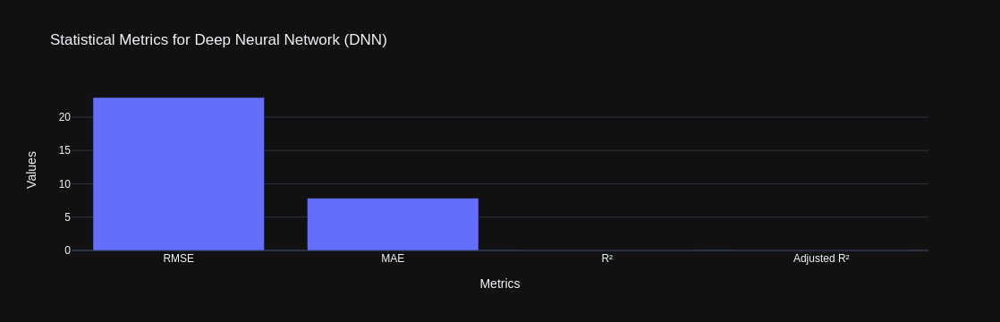

In [29]:
import plotly.graph_objects as go

# Data for plotting
metrics_dnn = ['RMSE', 'MAE', 'R²', 'Adjusted R²']
metric_values_dnn = [dnn_rmse, dnn_mae, dnn_r2, dnn_adjusted_r2]

# Create a bar plot for DNN
fig_dnn = go.Figure(data=[
    go.Bar(name='Deep Neural Network', x=metrics_dnn, y=metric_values_dnn)
])

# Customize the layout
fig_dnn.update_layout(
    title="Statistical Metrics for Deep Neural Network (DNN)",
    xaxis_title="Metrics",
    yaxis_title="Values",
    hovermode="x",
    showlegend=False
)

# Show the plot
fig_dnn.show()


Visualizing Training History

Available keys in the history object: dict_keys(['loss', 'mae', 'val_loss', 'val_mae'])


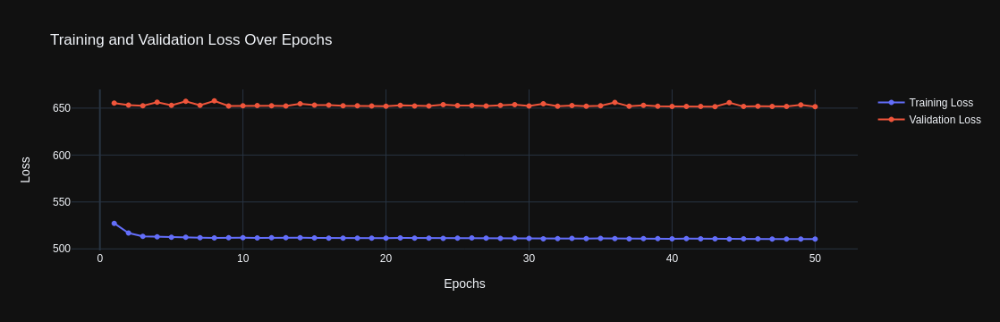

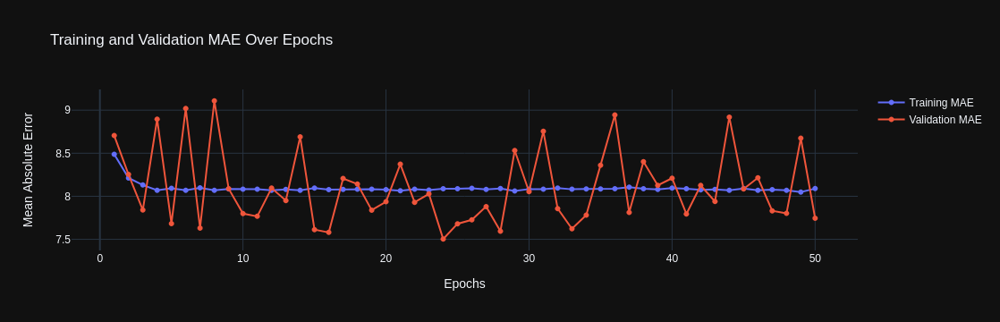

In [30]:
import plotly.graph_objects as go

# Check the available keys in the history object
history_data = history.history
print("Available keys in the history object:", history_data.keys())

# Extract loss and MAE (check if they exist)
loss = history_data.get('loss', [])
val_loss = history_data.get('val_loss', [])
mae = history_data.get('mae', [])
val_mae = history_data.get('val_mae', [])

# Plot Training and Validation Loss over Epochs
if loss:
    epochs = range(1, len(loss) + 1)

    # Create a plot for loss
    fig_loss = go.Figure()
    fig_loss.add_trace(go.Scatter(x=list(epochs), y=loss, mode='lines+markers', name='Training Loss'))
    
    if val_loss:
        fig_loss.add_trace(go.Scatter(x=list(epochs), y=val_loss, mode='lines+markers', name='Validation Loss'))

    fig_loss.update_layout(
        title="Training and Validation Loss Over Epochs",
        xaxis_title="Epochs",
        yaxis_title="Loss",
        hovermode="x"
    )
    fig_loss.show()

# Plot Training and Validation MAE over Epochs
if mae:
    fig_mae = go.Figure()
    fig_mae.add_trace(go.Scatter(x=list(epochs), y=mae, mode='lines+markers', name='Training MAE'))
    
    if val_mae:
        fig_mae.add_trace(go.Scatter(x=list(epochs), y=val_mae, mode='lines+markers', name='Validation MAE'))

    fig_mae.update_layout(
        title="Training and Validation MAE Over Epochs",
        xaxis_title="Epochs",
        yaxis_title="Mean Absolute Error",
        hovermode="x"
    )
    fig_mae.show()


Saving Results to a DataFrame and Text File

In [31]:
# Convert results to a DataFrame and display
results_detailed_df = pd.DataFrame(results_detailed)
print(results_detailed_df)

# Save to a text file
results_detailed_df.to_csv('detailed_results.txt', sep='\t', index=False)
print("Detailed results saved to 'detailed_results.txt'.")


                 Algorithm       RMSE       MAE        R²  Adjusted R²  \
0    OLS Linear Regression  22.963050  8.167320  0.018392     0.018231   
1  PCA + Linear Regression  22.965791  8.165871  0.018158     0.018077   
2            Random Forest  24.157118  9.429463 -0.086349    -0.086526   
3      Deep Neural Network  22.939923  7.830090  0.020368     0.020208   

                                             P-value  \
0  [7.173341769010819e-10, 8.727840799699791e-140...   
1                  [0.0, 0.0, 6.184660244541269e-15]   
2                                                N/A   
3                                                N/A   

                                         t-statistic  F-statistic  \
0  [6.162831431164282, 25.21002741047423, 8.80795...   617.134311   
1  [135.44437417978088, 49.00547948065332, 7.8013...  1231.199099   
2                                                N/A          N/A   
3                                                N/A          N/A   

  

Predicted vs Actual Insulin Dose Plots

In [32]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import os

# Create a directory to save the plots (optional)
output_dir = 'patient_plots'
os.makedirs(output_dir, exist_ok=True)

# Get a list of unique patient IDs (limit to the first 10)
unique_patient_ids = df['id'].unique()[:10]

# Loop over each patient (limited to the first 10) and generate a separate plot
for patient_id in unique_patient_ids:
    # Filter the data for the current patient
    patient_data = df[df['id'] == patient_id]
    
    # Ensure the corresponding predicted values are for the current patient
    patient_index = patient_data.index
    actual_dose = patient_data['Insulin']
    
    # Predictions for the current patient
    lr_pred_patient = ols_pred[patient_index]
    rf_pred_patient = rf_pred[patient_index]
    pca_lr_pred_patient = pca_ols_pred[patient_index]
    dnn_pred_patient = dnn_pred[patient_index]

    # Plot the actual insulin dose vs predicted doses from each model
    fig, ax = plt.subplots(figsize=(14, 7))

    # Plot actual insulin dose
    ax.plot(patient_data['timestamp'], actual_dose, label='Actual Insulin Dose', color='black', linestyle='--', linewidth=2)

    # Plot predicted values from each model with transparency and custom markers
    ax.plot(patient_data['timestamp'], lr_pred_patient, label='Linear Regression', marker='o', color='blue', linestyle='-', alpha=0.8, markersize=6)
    ax.plot(patient_data['timestamp'], rf_pred_patient, label='Random Forest', marker='x', color='green', linestyle='-', alpha=0.8, markersize=6)
    ax.plot(patient_data['timestamp'], pca_lr_pred_patient, label='PCA + Linear Regression', marker='s', color='red', linestyle='-', alpha=0.8, markersize=6)
    ax.plot(patient_data['timestamp'], dnn_pred_patient, label='Deep Neural Network', marker='d', color='purple', linestyle='-', alpha=0.8, markersize=6)

    # Customize the plot
    ax.set_xlabel('Timestamp', fontsize=12)
    ax.set_ylabel('Insulin Dose', fontsize=12)
    ax.set_title(f'Predicted vs Actual Insulin Dose for Patient {patient_id}', fontsize=14, fontweight='bold')

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)

    # Format the x-axis with dates for better visibility
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d %H:%M'))
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=6))

    # Add a grid for better readability
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)

    # Adjust the legend for better readability
    ax.legend(loc='upper left', fontsize=10, frameon=True)

    # Tight layout for better spacing
    plt.tight_layout()

    # Save the plot as a PNG file in the output directory
    output_path = os.path.join(output_dir, f'patient_{patient_id}_plot.png')
    plt.savefig(output_path)

    # Close the plot to free memory
    plt.close(fig)

    # Optionally, print a message to track progress
    print(f"Saved plot for patient {patient_id} to {output_path}")



Locator attempting to generate 6424 ticks ([80883.04166666667, ..., 82488.79166666667]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 6424 ticks ([80883.04166666667, ..., 82488.79166666667]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 6424 ticks ([80883.04166666667, ..., 82488.79166666667]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 6424 ticks ([80883.04166666667, ..., 82488.79166666667]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 6424 ticks ([80883.04166666667, ..., 82488.79166666667]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 6424 ticks ([80883.04166666667, ..., 82488.79166666667]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 6424 ticks ([80883.04166666667, ..., 82488.79166666667]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 6424 ticks ([80883.04166666667, ..., 82488.79166666667]), which exceeds L

Saved plot for patient 32771 to patient_plots/patient_32771_plot.png
Saved plot for patient 32774 to patient_plots/patient_32774_plot.png
Saved plot for patient 98310 to patient_plots/patient_98310_plot.png
Saved plot for patient 65544 to patient_plots/patient_65544_plot.png
Saved plot for patient 32777 to patient_plots/patient_32777_plot.png
Saved plot for patient 32779 to patient_plots/patient_32779_plot.png
Saved plot for patient 13 to patient_plots/patient_13_plot.png
Saved plot for patient 65556 to patient_plots/patient_65556_plot.png
Saved plot for patient 32790 to patient_plots/patient_32790_plot.png
Saved plot for patient 25 to patient_plots/patient_25_plot.png


Final results

In [33]:
import pandas as pd

# Initialize an empty DataFrame to store the results for all patients and all algorithms
results_df = pd.DataFrame(columns=['Patient ID', 'Timestamp', 'Actual Insulin Dose', 
                                   'Predicted Insulin Dose (Linear Regression)', 
                                   'Predicted Insulin Dose (Random Forest)',
                                   'Predicted Insulin Dose (PCA + Linear Regression)', 
                                   'Predicted Insulin Dose (Deep Neural Network)'])

# Loop over each patient
for patient_id in unique_patient_ids:
    # Filter the data for the current patient
    patient_data = df[df['id'] == patient_id]
    
    # Ensure the corresponding predicted values are for the current patient
    patient_index = patient_data.index
    actual_dose = patient_data['Insulin']
    
    # Predictions for the current patient from each model
    lr_pred_patient = ols_pred[patient_index]
    rf_pred_patient = rf_pred[patient_index]
    pca_lr_pred_patient = pca_ols_pred[patient_index]
    dnn_pred_patient = dnn_pred[patient_index]
    
    # Create a temporary DataFrame for the current patient
    patient_df = pd.DataFrame({
        'Patient ID': patient_id,
        'Timestamp': patient_data['timestamp'],
        'Actual Insulin Dose': actual_dose,
        'Predicted Insulin Dose (Linear Regression)': lr_pred_patient,
        'Predicted Insulin Dose (Random Forest)': rf_pred_patient,
        'Predicted Insulin Dose (PCA + Linear Regression)': pca_lr_pred_patient,
        'Predicted Insulin Dose (Deep Neural Network)': dnn_pred_patient
    })
    
    # Append the current patient's DataFrame to the overall results DataFrame
    results_df = pd.concat([results_df, patient_df], ignore_index=True)

# Write the results to an Excel file
output_excel_file = 'predicted_insulin_doses_all_patients.xlsx'
results_df.to_excel(output_excel_file, index=False)

# Print a success message
print(f"Predicted insulin doses have been written to {output_excel_file}")


Predicted insulin doses have been written to predicted_insulin_doses_all_patients.xlsx


/tmp/ipykernel_18712/860183922.py:37: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Interactive plots in HTML form

In [34]:
import plotly.graph_objects as go
import plotly.io as pio
import os

# Create a directory to save the plots (optional)
output_dir = 'patient_plots_interactive'
os.makedirs(output_dir, exist_ok=True)

# Get a list of unique patient IDs
unique_patient_ids = df['id'].unique()

# Loop over each patient and generate a separate interactive plot
for patient_id in unique_patient_ids:
    # Filter the data for the current patient
    patient_data = df[df['id'] == patient_id]
    
    # Ensure the corresponding predicted values are for the current patient
    patient_index = patient_data.index
    actual_dose = patient_data['Insulin']
    
    # Predictions for the current patient
    lr_pred_patient = ols_pred[patient_index]
    rf_pred_patient = rf_pred[patient_index]
    pca_lr_pred_patient = pca_ols_pred[patient_index]
    dnn_pred_patient = dnn_pred[patient_index]

    # Create the figure
    fig = go.Figure()

    # Plot actual insulin dose
    fig.add_trace(go.Scatter(x=patient_data['timestamp'], y=actual_dose, mode='lines+markers', 
                             name='Actual Insulin Dose', line=dict(color='black', dash='dash'), 
                             marker=dict(size=8)))

    # Plot predicted values from each model with different markers and colors
    fig.add_trace(go.Scatter(x=patient_data['timestamp'], y=lr_pred_patient, mode='lines+markers',
                             name='Linear Regression', line=dict(color='blue'), marker=dict(symbol='circle')))
    
    fig.add_trace(go.Scatter(x=patient_data['timestamp'], y=rf_pred_patient, mode='lines+markers',
                             name='Random Forest', line=dict(color='green'), marker=dict(symbol='x')))
    
    fig.add_trace(go.Scatter(x=patient_data['timestamp'], y=pca_lr_pred_patient, mode='lines+markers',
                             name='PCA + Linear Regression', line=dict(color='red'), marker=dict(symbol='square')))
    
    fig.add_trace(go.Scatter(x=patient_data['timestamp'], y=dnn_pred_patient, mode='lines+markers',
                             name='Deep Neural Network', line=dict(color='purple'), marker=dict(symbol='diamond')))

    # Customize the layout
    fig.update_layout(
        title=f'Predicted vs Actual Insulin Dose for Patient {patient_id}',
        xaxis_title='Timestamp',
        yaxis_title='Insulin Dose',
        xaxis_tickformat='%b %d %H:%M',  # Format the x-axis with readable dates
        xaxis=dict(
            rangeslider=dict(visible=True),  # Enable range slider for x-axis
            type='date'
        ),
        hovermode='x unified',  # Unified hover mode
        legend=dict(
            x=0.01, y=1.0, bgcolor='rgba(255, 255, 255, 0.5)',
            bordercolor='Black', borderwidth=1
        ),
        template='plotly_white',  # Use a clean white template
    )

    # Save the interactive plot as an HTML file
    output_path = os.path.join(output_dir, f'patient_{patient_id}_plot.html')
    pio.write_html(fig, file=output_path)

    # Optionally, print a message to track progress
    print(f"Saved interactive plot for patient {patient_id} to {output_path}")


Saved interactive plot for patient 32771 to patient_plots_interactive/patient_32771_plot.html
Saved interactive plot for patient 32774 to patient_plots_interactive/patient_32774_plot.html
Saved interactive plot for patient 98310 to patient_plots_interactive/patient_98310_plot.html
Saved interactive plot for patient 65544 to patient_plots_interactive/patient_65544_plot.html
Saved interactive plot for patient 32777 to patient_plots_interactive/patient_32777_plot.html
Saved interactive plot for patient 32779 to patient_plots_interactive/patient_32779_plot.html
Saved interactive plot for patient 13 to patient_plots_interactive/patient_13_plot.html
Saved interactive plot for patient 65556 to patient_plots_interactive/patient_65556_plot.html
Saved interactive plot for patient 32790 to patient_plots_interactive/patient_32790_plot.html
Saved interactive plot for patient 25 to patient_plots_interactive/patient_25_plot.html
Saved interactive plot for patient 28 to patient_plots_interactive/patie

IndexError: index 24436 is out of bounds for axis 0 with size 24436